In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import graphviz
import seaborn as sns; sns.set()
from sklearn.linear_model import SGDClassifier 
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, AdaBoostClassifier, ExtraTreesClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.naive_bayes import GaussianNB, MultinomialNB, BernoulliNB
from sklearn.neighbors.nearest_centroid import NearestCentroid
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split, ParameterGrid
from sklearn.metrics import *
import time

%matplotlib inline

In [2]:
#This loop only using all the possible data
df = pd.read_csv('final_data.csv')

In [3]:
df.shape

(24855, 27)

In [4]:
acs =pd.read_csv('fips_acs.csv')

In [5]:
acs.columns

Index(['fips', 'per_capita_income', 'poverty_stat', 'household_income',
       'mortgage_stat', 'school_enrollment_16-19', 'own_children_under18',
       'SSI_income', 'grandparent_care', 'military_service', 'education_25',
       'property_value_occupied', 'retirement_income', 'rent_over_income',
       'zip'],
      dtype='object')

In [6]:
df.zip.nunique()

1208

In [7]:
acs.zip.nunique()

244

In [8]:
df=df.dropna(subset=['zip'])

In [9]:
df = acs.merge(df, how="inner")

In [10]:
df.shape

(22923, 41)

In [11]:
df.columns

Index(['fips', 'per_capita_income', 'poverty_stat', 'household_income',
       'mortgage_stat', 'school_enrollment_16-19', 'own_children_under18',
       'SSI_income', 'grandparent_care', 'military_service', 'education_25',
       'property_value_occupied', 'retirement_income', 'rent_over_income',
       'zip', 'mni_no', 'dedupe_id', 'dob', 'sex', 'race', 'mar_stat', 'city',
       'state', 'case_no', 'case_type', 'booking_no', 'arresting_agency',
       'arresting_agency_type', 'booking_date', 'release_date', 'bail_type',
       'bail_amt', 'bailed_out', 'pri_dx_value', 'refferal_source',
       'mh_treatment', 're_entry', 'age', 'after_released', 'within_one',
       'within_two'],
      dtype='object')

In [12]:
#Check the prob of re-entry within one year
df['within_one'].sum()/df.shape[0]

0.2261047855865288

In [13]:
#Check the prob of re-entry within two year
df['within_two'].sum()/df.shape[0]

0.281158661606247

In [14]:
df = df.drop(['re_entry', 'age', 'mni_no', 'dedupe_id', 'dob', 'state', 'city', 'fips', 'zip', 'release_date', 'case_no', 'booking_no', 'pri_dx_value',
       'refferal_source'], axis=1)

In [15]:
df.columns

Index(['per_capita_income', 'poverty_stat', 'household_income',
       'mortgage_stat', 'school_enrollment_16-19', 'own_children_under18',
       'SSI_income', 'grandparent_care', 'military_service', 'education_25',
       'property_value_occupied', 'retirement_income', 'rent_over_income',
       'sex', 'race', 'mar_stat', 'case_type', 'arresting_agency',
       'arresting_agency_type', 'booking_date', 'bail_type', 'bail_amt',
       'bailed_out', 'pri_dx_value', 'refferal_source', 'mh_treatment',
       'after_released', 'within_one', 'within_two'],
      dtype='object')

In [16]:
df.head()

,per_capita_income,poverty_stat,household_income,mortgage_stat,school_enrollment_16-19,own_children_under18,SSI_income,grandparent_care,military_service,education_25,...,booking_date,bail_type,bail_amt,bailed_out,pri_dx_value,refferal_source,mh_treatment,after_released,within_one,within_two
0,26836.0,1118,456,364,167,175,456,692,66,776,...,2013-12-30 00:00:00,SUR,1500.0,1,UNSPECIFIED AFFECTIVE PSYCHOSIS,NaN,0,586.0,0,1
1,26836.0,1118,456,364,167,175,456,692,66,776,...,2013-11-10 00:00:00,SUR,15000.0,1,DEPRESSIVE DISORDER NOS,OTHERS,1,603.0,0,1
2,26836.0,1118,456,364,167,175,456,692,66,776,...,2012-10-10 00:00:00,SUR,20000.0,1,UNSPECIFIED AFFECTIVE PSYCHOSIS,SELF,1,-41.0,1,1
3,26836.0,1118,456,364,167,175,456,692,66,776,...,2011-05-26 00:00:00,SUR,5000.0,1,"ALCOHOL DEPENDENCE, UNCOMPLICATED",OTHERS,1,7.0,1,1
4,26836.0,1118,456,364,167,175,456,692,66,776,...,2011-06-27 00:00:00,SUR,5000.0,1,"ALCOHOL DEPENDENCE, UNCOMPLICATED",OTHERS,1,32.0,1,1


In [17]:
dummy_vals = ['sex', 'race','mar_stat', 'case_type', 'arresting_agency', 'arresting_agency_type', 'bail_type' ]

In [18]:
#generate dummy variable for specific column
def getting_dummy(df, col):
    '''
    Helper function to create dummy variables in dataframe for specific column
    This function will return dataframe
    '''
    dummies = pd.get_dummies(df[col]).rename(columns=lambda x: str(col)+ str(x))
    df = pd.concat([df, dummies], axis=1)
    df.drop([col], inplace=True, axis=1)
    return df

In [19]:
for dummy in dummy_vals:
    df = getting_dummy(df, dummy)

In [20]:
#4 GenerateFeatures/Predictors: discretize a continuous variable 
def discrete_val(df, cols, bins=4):
    '''
    Helper function to discrete the continueous variable in dataframe into 4 bins
    This function will return dictionary mapping column name to the bin values
    '''
    for col in cols:
        new = col+'_binned'
        df[new] = pd.cut(df[col], bins, include_lowest=True, labels = range(0,bins))
        df.drop([col], inplace=True, axis=1)
    return df

In [21]:
binv = ['per_capita_income', 'poverty_stat', 'household_income',
       'mortgage_stat', 'school_enrollment_16-19', 'own_children_under18',
       'SSI_income', 'grandparent_care', 'military_service', 'education_25',
       'property_value_occupied', 'retirement_income', 'rent_over_income','bail_amt']
df = discrete_val(df, binv, 6)

In [22]:
indepv = list(df.columns)

In [23]:
indepv.remove('after_released')

In [24]:
indepv.remove('within_one')

In [25]:
indepv.remove('within_two')

In [26]:
indepv

['booking_date',
 'bailed_out',
 'mh_treatment',
 'sexFEMALE',
 'sexMALE',
 'raceAMERICAN INDIAN OR ALASKA NATIVE',
 'raceASIAN',
 'raceBLACK OR AFRICAN AMERICAN',
 'raceWHITE',
 'mar_statA',
 'mar_statD',
 'mar_statM',
 'mar_statN',
 'mar_statS',
 'mar_statU',
 'mar_statW',
 'mar_statY',
 'case_typeCR',
 'case_typeDV',
 'case_typeJV',
 'arresting_agencyFAIRWAY P.D.',
 'arresting_agencyGARDNER P.D.',
 'arresting_agencyJOHNSON COUNTY PARK PATROL',
 "arresting_agencyJOHNSON COUNTY SHERIFF'S DEPARTMENT",
 'arresting_agencyKANSAS HIGHWAY PATROL',
 'arresting_agencyLAKE QUIVIRA P.D.',
 'arresting_agencyLEAWOOD P.D.',
 'arresting_agencyLENEXA P.D.',
 'arresting_agencyMERRIAM P.D.',
 'arresting_agencyMISSION P.D.',
 'arresting_agencyOLATHE P.D.',
 'arresting_agencyOTHER AGENCY',
 'arresting_agencyOVERLAND PARK P.D.',
 'arresting_agencyPRAIRIE VILLAGE P.D.',
 'arresting_agencyROELAND PARK P.D.',
 'arresting_agencySHAWNEE MISSION SCHOOL SECURITY',
 'arresting_agencySHAWNEE P.D.',
 'arresting_ag

In [27]:
def temporal_split(df, time_col, start_time, mid_time, end_time):
    train = df[(df[time_col] >= start_time) & (df[time_col] < mid_time) ]
    test = df[(df[time_col] >= mid_time)  & (df[time_col] < end_time)]
    train = train.drop([time_col], axis=1)
    test = test.drop([time_col], axis=1)
    return train, test

In [28]:
indepv.remove('booking_date')

In [29]:
def split_data(train, test, y):
    '''
    Split the data into training and testing set
    
    And save them to run try different models
    '''
    x_test = test[indepv] 
    x_train = train[indepv]
    y_test = test[y]
    y_train = train[y]
    
    return x_train, x_test, y_train, y_test

In [30]:
train, test = temporal_split(df, 'booking_date', '2010-01-01', '2015-07-01', '2018-01-01' )

In [31]:
train.shape

(19516, 261)

In [32]:
test.shape

(3407, 261)

In [33]:
clfs = {'RF': RandomForestClassifier(),
    'Boost': AdaBoostClassifier(DecisionTreeClassifier(max_depth=1)),
    'Logit': LogisticRegression(),
    'SVM': SVC(probability=True, random_state=0),
    'Tree': DecisionTreeClassifier(),
    'Bag': BaggingClassifier(),
    'KNN': KNeighborsClassifier(),
    'ET': ExtraTreesClassifier(n_estimators=10, n_jobs=-1, criterion='entropy'),
    'NB': GaussianNB()}

small_grid = {'RF':{'n_estimators': [10,100], 'max_depth': [5,50], 'max_features': ['sqrt','log2'],'min_samples_split': [2,10]},
    'Boost': {'algorithm': ['SAMME', 'SAMME.R'], 'n_estimators': [1,10,100,1000]},
    'Logit': {'penalty': ['l1','l2'], 'C': [0.001,0.01,0.1,1,10]},
    'SVM' :{'C' :[0.01,0.1,1,10],'kernel':['linear']},
    'Tree': {'criterion': ['gini', 'entropy'], 'max_depth': [5,10,20,50], 'max_features': ['sqrt','log2'],'min_samples_split': [2,5]},
    'Bag':{'n_estimators':[1,10,20,50], 'max_samples':[5,10], 'max_features': [5,10]},
    'KNN' :{'n_neighbors': [1,10,50],'weights': ['uniform','distance'],'algorithm': ['auto']},
    'ET': {'n_estimators': [10,100], 'criterion' : ['gini', 'entropy'] ,'max_depth': [5,50], 'max_features': ['sqrt','log2'],'min_samples_split': [2,10], 'n_jobs': [-1]},
    'NB' : {}}

In [34]:
def generate_binary_at_k(y_scores, k):
    '''
    Set first k% as 1, the rest as 0.
    '''
    cutoff_index = int(len(y_scores) * (k / 100.0))
    test_predictions_binary = [1 if x < cutoff_index else 0 for x in range(len(y_scores))]
    return test_predictions_binary

In [35]:
def scores_at_k(y_true, y_scores, k):
    '''
    For a given level of k, calculate corresponding
    precision, recall, and f1 scores.
    '''
    preds_at_k = generate_binary_at_k(y_scores, k)
    precision = precision_score(y_true, preds_at_k)
    recall = recall_score(y_true, preds_at_k)
    f1 = f1_score(y_true, preds_at_k)
    return precision, recall, f1

In [36]:
def plot_precision_recall_n(y_true, y_score, model_name,  para = None):
    precision_curve, recall_curve, pr_thresholds = precision_recall_curve(y_true, y_score)
    precision_curve = precision_curve[:-1]
    recall_curve = recall_curve[:-1]
    pct_above_per_thresh = []
    number_scored = len(y_score)
    for value in pr_thresholds:
        num_above_thresh = len(y_score[y_score>=value])
        pct_above_thresh = num_above_thresh / float(number_scored)
        pct_above_per_thresh.append(pct_above_thresh)
    pct_above_per_thresh = np.array(pct_above_per_thresh)
    plt.clf()
    fig, ax1 = plt.subplots()
    ax1.plot(pct_above_per_thresh, precision_curve, 'b')
    ax1.set_xlabel('percent of population')
    ax1.set_ylabel('precision', color='b')
    ax2 = ax1.twinx()
    ax2.plot(pct_above_per_thresh, recall_curve, 'r')
    ax2.set_ylabel('recall', color='r')
    
    plt.title('2-class Precision-Recall curve for {} model: AUC={:.2f} \n with parameters: {}'.\
                        format(model_name, average_precision_score(y_true, y_score), para))
    plt.show()

In [37]:
def clf_loop(models, x_train, x_test, y_train, y_test):
    '''
    Run model with given params on x and y
    and print out the scores for comparison
    '''
    results_df = pd.DataFrame(columns=('model_type', 'parameters', 'accuracy','auc-roc', 'auc-pr', 'time', 'precision,recall,f1 at_5',
     'precision,recall,f1 at_10', 'precision,recall,f1 at_20', 'precision,recall,f1 at_30', 'precision,recall,f1 at_50'))
    for index, clf in enumerate([clfs[x] for x in models]):
        model_params = small_grid[models[index]]
        for p in ParameterGrid(model_params):
            try:
                start = time.time()
                clf.set_params(**p)
                y_pred_probs = clf.fit(x_train, y_train).predict_proba(x_test)[:,1]
                accuracy = clf.score(x_test, y_test)
                end = time.time()
                #Zip, unzip to ensure corresponding order
                y_pred_probs_sorted, y_test_sorted = zip(*sorted(zip(y_pred_probs, y_test), reverse=True))

                results_df.loc[len(results_df)] = [models[index], p, accuracy,
                                             roc_auc_score(y_test, y_pred_probs),
                                             average_precision_score(y_test, y_pred_probs), end-start,                                                     
                                             scores_at_k(y_test_sorted,y_pred_probs_sorted,5.0),
                                             scores_at_k(y_test_sorted,y_pred_probs_sorted,10.0),
                                             scores_at_k(y_test_sorted,y_pred_probs_sorted,20.0),
                                             scores_at_k(y_test_sorted,y_pred_probs_sorted,30.0),
                                             scores_at_k(y_test_sorted,y_pred_probs_sorted,50.0)]

                plot_precision_recall_n(y_test, y_pred_probs, models[index])
                
            except IndexError as e:
                print(e)
                continue
    return results_df

In [38]:
#Running classifiers to predict if the person re-enter within one years
x_train, x_test, y_train, y_test = split_data(train, test, 'within_one')

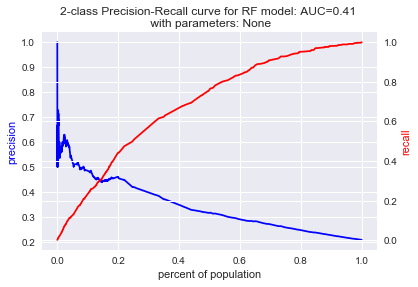

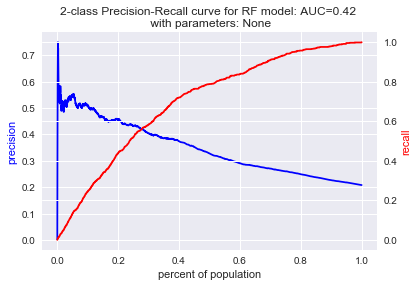

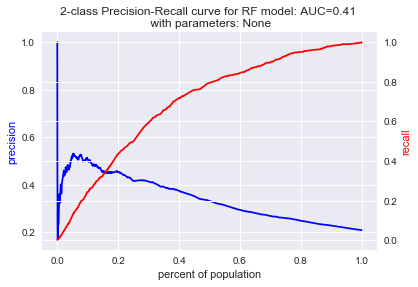

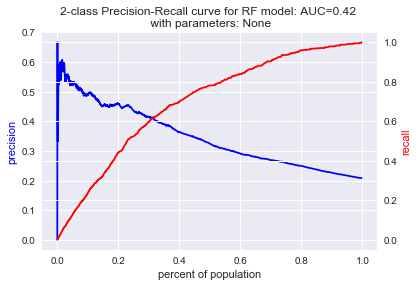

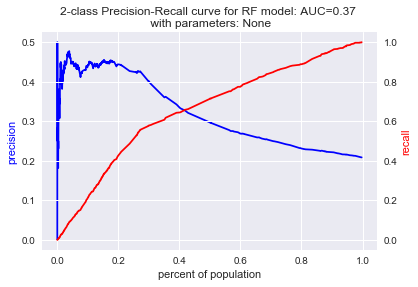

...

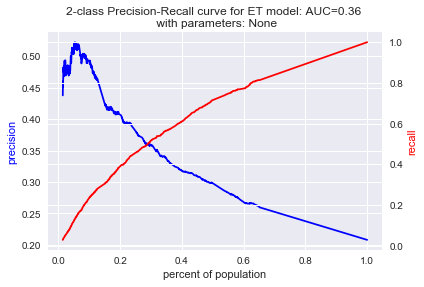

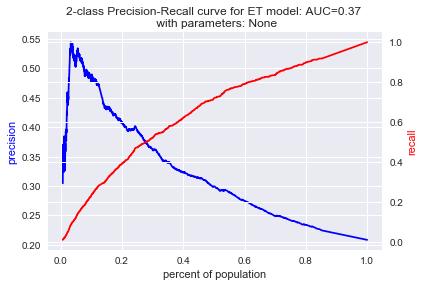

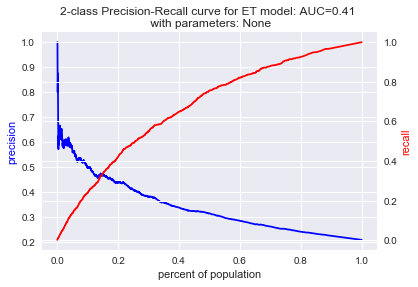

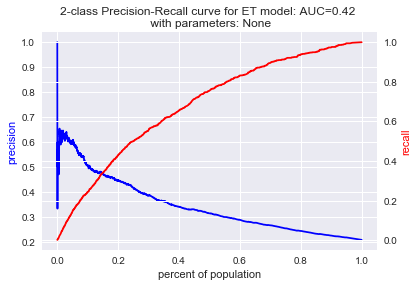

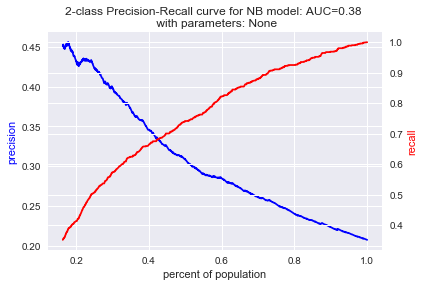

In [39]:
results = clf_loop(["RF", "Boost", "Bag", "Logit", "Tree", "ET", "NB"], x_train, x_test, y_train, y_test)

In [40]:
from IPython.display import display
display(results)

,model_type,parameters,accuracy,auc-roc,auc-pr,time,"precision,recall,f1 at_5","precision,recall,f1 at_10","precision,recall,f1 at_20","precision,recall,f1 at_30","precision,recall,f1 at_50"
0,RF,"{'max_depth': 5, 'max_features': 'sqrt', 'min_...",0.797476,0.734300,0.408694,0.418053,"(0.5411764705882353, 0.12976022566995768, 0.20...","(0.5117647058823529, 0.2454160789844852, 0.331...","(0.4581497797356828, 0.4400564174894217, 0.448...","(0.4158512720156556, 0.5994358251057827, 0.491...","(0.31650029359953025, 0.7602256699576869, 0.44..."
1,RF,"{'max_depth': 5, 'max_features': 'sqrt', 'min_...",0.791606,0.749433,0.418773,1.164899,"(0.5470588235294118, 0.1311706629055007, 0.211...","(0.5058823529411764, 0.24259520451339917, 0.32...","(0.4566813509544787, 0.4386459802538787, 0.447...","(0.4050880626223092, 0.5839210155148096, 0.478...","(0.3282442748091603, 0.7884344146685472, 0.463..."
2,RF,"{'max_depth': 5, 'max_features': 'sqrt', 'min_...",0.792780,0.746844,0.405297,0.340600,"(0.5176470588235295, 0.12411847672778561, 0.20...","(0.5088235294117647, 0.24400564174894218, 0.32...","(0.45374449339207046, 0.43582510578279265, 0.4...","(0.4217221135029354, 0.607898448519041, 0.4979...","(0.3305930710510863, 0.7940761636107193, 0.466..."
3,RF,"{'max_depth': 5, 'max_features': 'sqrt', 'min_...",0.793660,0.746719,0.417971,1.035256,"(0.5235294117647059, 0.12552891396332863, 0.20...","(0.48823529411764705, 0.23413258110014104, 0.3...","(0.45961820851688695, 0.4414668547249647, 0.45...","(0.41389432485322897, 0.5966149506346967, 0.48...","(0.3253082795067528, 0.7813822284908322, 0.459..."
4,RF,"{'max_depth': 5, 'max_features': 'log2', 'min_...",0.791899,0.696869,0.367413,0.350632,"(0.4588235294117647, 0.11001410437235543, 0.17...","(0.4411764705882353, 0.21156558533145275, 0.28...","(0.44640234948604995, 0.4287729196050776, 0.43...","(0.40117416829745595, 0.5782792665726375, 0.47...","(0.29712272460364064, 0.7136812411847673, 0.41..."
5,RF,"{'max_depth': 5, 'max_features': 'log2', 'min_...",0.791899,0.743316,0.424381,0.739245,"(0.5529411764705883, 0.1325811001410437, 0.213...","(0.5147058823529411, 0.2468265162200282, 0.333...","(0.4566813509544787, 0.4386459802538787, 0.447...","(0.41682974559686886, 0.6008462623413258, 0.49...","(0.3182618907809748, 0.764456981664316, 0.4494..."
6,RF,"{'max_depth': 5, 'max_features': 'log2', 'min_...",0.791899,0.697844,0.375182,0.321323,"(0.4823529411764706, 0.1156558533145275, 0.186...","(0.5323529411764706, 0.2552891396332863, 0.345...","(0.4522760646108664, 0.43441466854724964, 0.44...","(0.46868884540117417, 0.6755994358251057, 0.55...","(0.30064591896652965, 0.7221438645980254, 0.42..."
7,RF,"{'max_depth': 5, 'max_features': 'log2', 'min_...",0.791899,0.745715,0.430532,0.811668,"(0.5235294117647059, 0.12552891396332863, 0.20...","(0.5147058823529411, 0.2468265162200282, 0.333...","(0.45961820851688695, 0.4414668547249647, 0.45...","(0.40998043052837574, 0.5909732016925247, 0.48...","(0.3264826776277158, 0.7842031029619182, 0.461..."
8,RF,"{'max_depth': 50, 'max_features': 'sqrt', 'min...",0.777223,0.681410,0.365853,0.638621,"(0.5, 0.11988716502115655, 0.19340159271899884)","(0.5058823529411764, 0.24259520451339917, 0.32...","(0.3920704845814978, 0.3765867418899859, 0.384...","(0.3561643835616438, 0.5133991537376587, 0.420...","(0.29770992366412213, 0.7150916784203103, 0.42..."
9,RF,"{'max_depth': 50, 'max_features': 'sqrt', 'min...",0.785735,0.708089,0.396403,3.989512,"(0.5411764705882353, 0.12976022566995768, 0.20...","(0.4823529411764706, 0.231311706629055, 0.3126...","(0.41409691629955947, 0.39774330042313116, 0.4...","(0.3679060665362035, 0.5303244005641748, 0.434...","(0.3088667058132707, 0.7418899858956276, 0.436..."


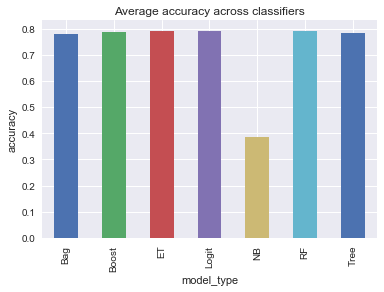

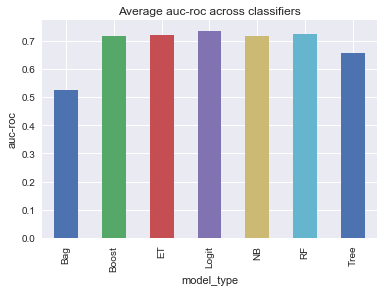

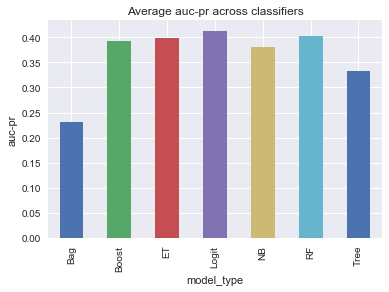

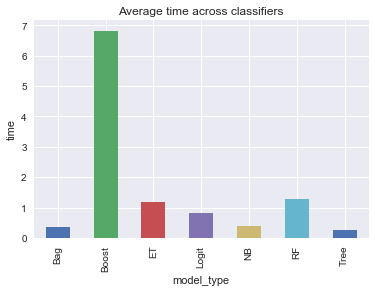

In [41]:
for item in ['accuracy', 'auc-roc','auc-pr','time']:
    plt.figure()
    results.groupby(['model_type'])[item].mean().plot(kind='bar', title='Average '+item+' across classifiers')
    plt.ylabel(item)

In [42]:
models =results.groupby('model_type')['auc-pr'].nlargest(1)

In [43]:
models

model_type     
Bag         39     0.313542
Boost       22     0.436385
ET          103    0.427521
Logit       49     0.439094
NB          114    0.380370
RF          7      0.430532
Tree        71     0.411530
Name: auc-pr, dtype: float64

In [44]:
results.loc[[38, 22, 100,48,114,2,55]].iloc[:,0:6]

,model_type,parameters,accuracy,auc-roc,auc-pr,time
38,Bag,"{'max_features': 10, 'max_samples': 10, 'n_est...",0.791899,0.444953,0.185374,0.398906
22,Boost,"{'algorithm': 'SAMME.R', 'n_estimators': 100}",0.793954,0.748768,0.436385,2.637925
100,ET,"{'criterion': 'entropy', 'max_depth': 5, 'max_...",0.793954,0.729616,0.404974,0.624909
48,Logit,"{'C': 10, 'penalty': 'l1'}",0.797182,0.750834,0.439065,2.388848
114,NB,{},0.387144,0.717926,0.380370,0.402639
2,RF,"{'max_depth': 5, 'max_features': 'sqrt', 'min_...",0.792780,0.746844,0.405297,0.340600
55,Tree,"{'criterion': 'gini', 'max_depth': 10, 'max_fe...",0.780452,0.716519,0.369471,0.254111


In [45]:
results.loc[55]['parameters']

{'criterion': 'gini',
 'max_depth': 10,
 'max_features': 'sqrt',
 'min_samples_split': 5}

In [46]:
#Printing out the best decision tree
dt = DecisionTreeClassifier(criterion='gini', max_depth=10, max_features='sqrt', min_samples_split=5)

In [47]:
tree = dt.fit(x_train, y_train)

In [48]:
tree_viz = export_graphviz(tree, out_file=None, feature_names=indepv, rounded=True, filled=True)
graph =graphviz.Source(tree_viz)

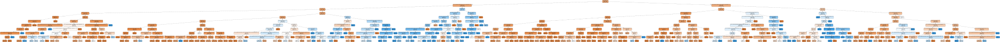

In [49]:
graph

In [50]:
#Running classifiers to predict if the person re-enter within two years

In [51]:
x_train, x_test, y_train2, y_test2 = split_data(train, test, 'within_two')

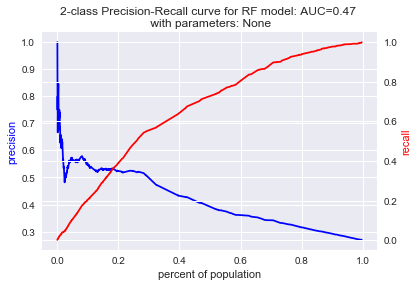

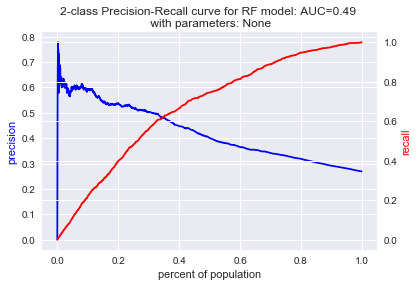

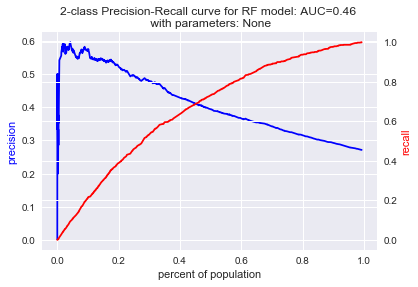

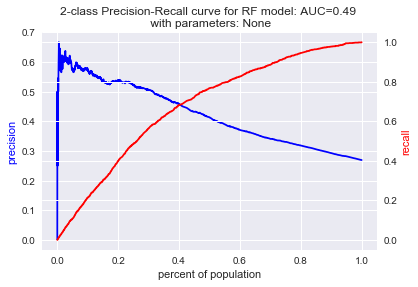

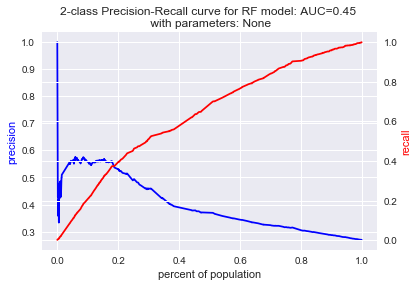

...

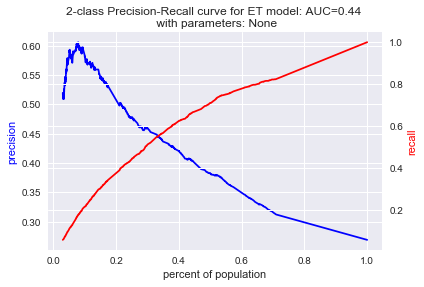

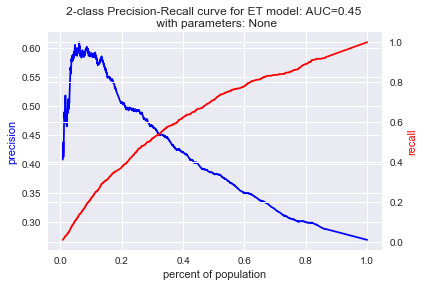

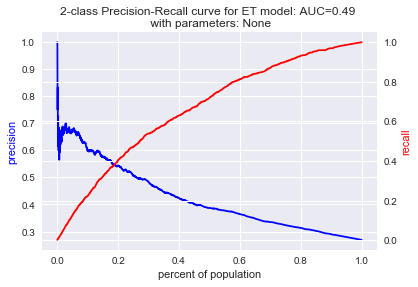

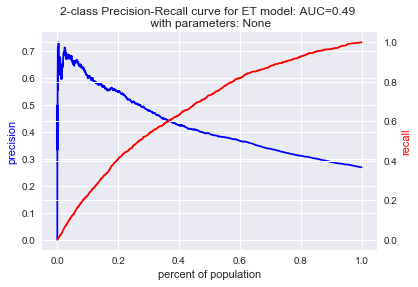

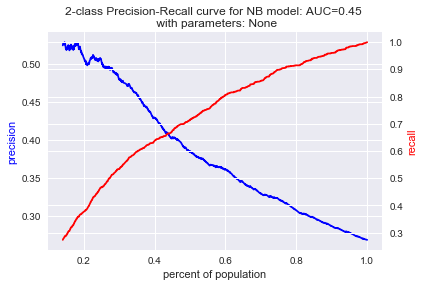

In [52]:
results2 = clf_loop(["RF", "Boost", "Bag", "Logit", "Tree",  "ET", "NB"], x_train, x_test, y_train2, y_test2)

In [53]:
from IPython.display import display
display(results2)

,model_type,parameters,accuracy,auc-roc,auc-pr,time,"precision,recall,f1 at_5","precision,recall,f1 at_10","precision,recall,f1 at_20","precision,recall,f1 at_30","precision,recall,f1 at_50"
0,RF,"{'max_depth': 5, 'max_features': 'sqrt', 'min_...",0.733783,0.724760,0.470943,0.409402,"(0.5647058823529412, 0.10468920392584515, 0.17...","(0.5529411764705883, 0.2050163576881134, 0.299...","(0.5242290748898678, 0.3893129770992366, 0.446...","(0.5097847358121331, 0.5681570338058888, 0.537...","(0.3969465648854962, 0.737186477644493, 0.5160..."
1,RF,"{'max_depth': 5, 'max_features': 'sqrt', 'min_...",0.743176,0.737134,0.488857,0.975550,"(0.5941176470588235, 0.11014176663031625, 0.18...","(0.5911764705882353, 0.21919302071973829, 0.31...","(0.5374449339207048, 0.39912758996728465, 0.45...","(0.5019569471624267, 0.559432933478735, 0.5291...","(0.4016441573693482, 0.7459105779716467, 0.522..."
2,RF,"{'max_depth': 5, 'max_features': 'sqrt', 'min_...",0.745230,0.723083,0.464650,0.342207,"(0.5764705882352941, 0.10687022900763359, 0.18...","(0.5705882352941176, 0.21155943293347873, 0.30...","(0.5227606461086637, 0.3882224645583424, 0.445...","(0.48140900195694714, 0.5365321701199564, 0.50...","(0.39459776864357016, 0.732824427480916, 0.512..."
3,RF,"{'max_depth': 5, 'max_features': 'sqrt', 'min_...",0.745230,0.742086,0.486937,0.969202,"(0.5764705882352941, 0.10687022900763359, 0.18...","(0.5764705882352941, 0.21374045801526717, 0.31...","(0.5374449339207048, 0.39912758996728465, 0.45...","(0.5068493150684932, 0.5648854961832062, 0.534...","(0.4128009395184968, 0.7666303162486369, 0.536..."
4,RF,"{'max_depth': 5, 'max_features': 'log2', 'min_...",0.729381,0.687162,0.445225,0.300318,"(0.5588235294117647, 0.10359869138495092, 0.17...","(0.5735294117647058, 0.21264994547437296, 0.31...","(0.5315712187958884, 0.39476553980370777, 0.45...","(0.45792563600782776, 0.5103598691384951, 0.48...","(0.3769817968291251, 0.7001090512540894, 0.490..."
5,RF,"{'max_depth': 5, 'max_features': 'log2', 'min_...",0.730555,0.737632,0.488520,0.746459,"(0.6176470588235294, 0.11450381679389313, 0.19...","(0.6, 0.22246455834242093, 0.32458233890214794)","(0.5330396475770925, 0.39585605234460197, 0.45...","(0.5058708414872799, 0.5637949836423118, 0.533...","(0.4022313564298297, 0.7470010905125409, 0.522..."
6,RF,"{'max_depth': 5, 'max_features': 'log2', 'min_...",0.733490,0.708850,0.465498,0.350207,"(0.6058823529411764, 0.11232279171210469, 0.18...","(0.5705882352941176, 0.21155943293347873, 0.30...","(0.5506607929515418, 0.4089422028353326, 0.469...","(0.4931506849315068, 0.549618320610687, 0.5198...","(0.38755137991779215, 0.7197382769901853, 0.50..."
7,RF,"{'max_depth': 5, 'max_features': 'log2', 'min_...",0.730555,0.738069,0.483114,0.747144,"(0.5705882352941176, 0.10577971646673937, 0.17...","(0.5794117647058824, 0.2148309705561614, 0.313...","(0.5345080763582967, 0.3969465648854962, 0.455...","(0.5078277886497065, 0.5659760087241004, 0.535...","(0.40810334703464474, 0.7579062159214831, 0.53..."
8,RF,"{'max_depth': 50, 'max_features': 'sqrt', 'min...",0.737012,0.701283,0.467397,0.596035,"(0.6294117647058823, 0.11668484187568157, 0.19...","(0.6264705882352941, 0.23227917121046893, 0.33...","(0.5227606461086637, 0.3882224645583424, 0.445...","(0.4589041095890411, 0.5114503816793893, 0.483...","(0.3863769817968291, 0.7175572519083969, 0.502..."
9,RF,"{'max_depth': 50, 'max_features': 'sqrt', 'min...",0.741415,0.710059,0.482560,3.857422,"(0.6588235294117647, 0.12213740458015267, 0.20...","(0.5970588235294118, 0.22137404580152673, 0.32...","(0.527165932452276, 0.3914940021810251, 0.4493...","(0.4637964774951076, 0.5169029443838604, 0.488...","(0.38755137991779215, 0.7197382769901853, 0.50..."


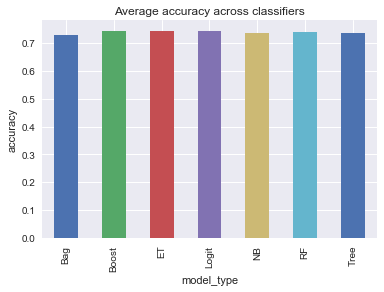

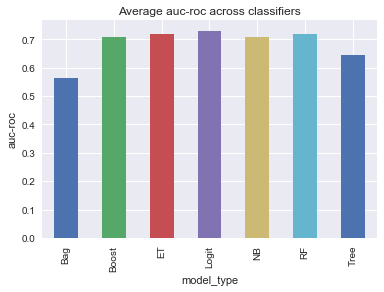

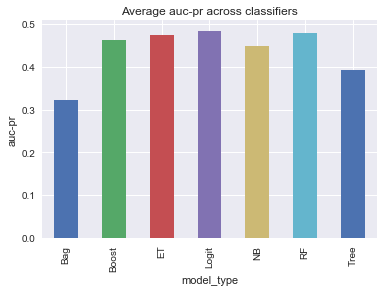

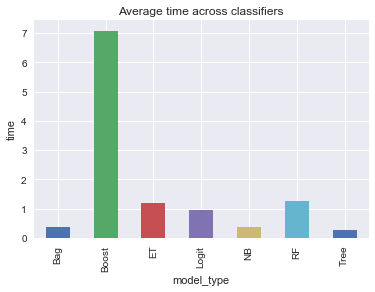

In [54]:
for item in ['accuracy', 'auc-roc','auc-pr','time']:
    plt.figure()
    results2.groupby(['model_type'])[item].mean().plot(kind='bar', title='Average '+item+' across classifiers')
    plt.ylabel(item)

In [55]:
models2 =results2.groupby('model_type')['auc-pr'].nlargest(1)

In [56]:
models2

model_type     
Bag         39     0.422383
Boost       22     0.508766
ET          105    0.496513
Logit       48     0.509225
NB          114    0.449564
RF          15     0.498036
Tree        54     0.461568
Name: auc-pr, dtype: float64

In [57]:
results2.loc[[30, 22, 97, 48, 114, 11, 61]].iloc[:,0:6]

,model_type,parameters,accuracy,auc-roc,auc-pr,time
30,Bag,"{'max_features': 5, 'max_samples': 10, 'n_esti...",0.730848,0.512629,0.283745,0.430711
22,Boost,"{'algorithm': 'SAMME.R', 'n_estimators': 100}",0.746404,0.743328,0.508766,2.720532
97,ET,"{'criterion': 'gini', 'max_depth': 50, 'max_fe...",0.749633,0.725924,0.493132,2.206805
48,Logit,"{'C': 10, 'penalty': 'l1'}",0.750220,0.741327,0.509225,2.664714
114,NB,{},0.737306,0.708161,0.449564,0.360955
11,RF,"{'max_depth': 50, 'max_features': 'sqrt', 'min...",0.757264,0.730791,0.496162,2.922692
61,Tree,"{'criterion': 'gini', 'max_depth': 20, 'max_fe...",0.743176,0.678449,0.428875,0.281237


In [58]:
results2.loc[61]['parameters']

{'criterion': 'gini',
 'max_depth': 20,
 'max_features': 'log2',
 'min_samples_split': 5}

In [59]:
#Printing out the best decision tree
dt = DecisionTreeClassifier(criterion='gini', max_depth=20, max_features='log2', min_samples_split=5)

In [60]:
tree = dt.fit(x_train, y_train2)

In [61]:
tree_viz = export_graphviz(tree, out_file=None, feature_names=indepv, rounded=True, filled=True)
graph =graphviz.Source(tree_viz)

In [62]:
graph

Feature ranking:
1. bailed_out (0.084807)
2. mh_treatment (0.059343)
3. sexFEMALE (0.051149)
4. sexMALE (0.043432)
5. raceAMERICAN INDIAN OR ALASKA NATIVE (0.040373)
6. raceASIAN (0.035729)
7. raceBLACK OR AFRICAN AMERICAN (0.024331)
8. raceWHITE (0.024151)
9. mar_statA (0.023845)
10. mar_statD (0.023231)
11. mar_statM (0.021649)
12. mar_statN (0.021086)
13. mar_statS (0.018114)
14. mar_statU (0.018029)
15. mar_statW (0.017853)
16. mar_statY (0.017804)
17. case_typeCR (0.017028)
18. case_typeDV (0.015457)
19. case_typeJV (0.015287)
20. arresting_agencyFAIRWAY P.D. (0.015223)
21. arresting_agencyGARDNER P.D. (0.015122)
22. arresting_agencyJOHNSON COUNTY PARK PATROL (0.015095)
23. arresting_agencyJOHNSON COUNTY SHERIFF'S DEPARTMENT (0.014763)
24. arresting_agencyKANSAS HIGHWAY PATROL (0.014489)
25. arresting_agencyLAKE QUIVIRA P.D. (0.014152)
26. arresting_agencyLEAWOOD P.D. (0.014073)
27. arresting_agencyLENEXA P.D. (0.013538)
28. arresting_agencyMERRIAM P.D. (0.013488)
29. arresting_ag

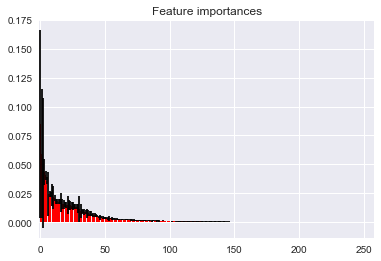

In [63]:
# Build a forest and compute the feature importances
forest = ExtraTreesClassifier(n_estimators=250,
                              random_state=0)

forest.fit(x_train, y_train)
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")

for f in range(x_train.shape[1]):
    print("%d. %s (%f)" % (f + 1, indepv[f], importances[indices[f]]))

# Plot the feature importances of the forest
plt.figure()
plt.title("Feature importances")
plt.bar(range(x_train.shape[1]), importances[indices],
       color="r", yerr=std[indices], align="center")
plt.xlim([-1, x_train.shape[1]])
plt.show()

Feature ranking:
1. bailed_out (0.088149)
2. mh_treatment (0.051979)
3. sexFEMALE (0.051808)
4. sexMALE (0.050477)
5. raceAMERICAN INDIAN OR ALASKA NATIVE (0.043820)
6. raceASIAN (0.037275)
7. raceBLACK OR AFRICAN AMERICAN (0.026042)
8. raceWHITE (0.024920)
9. mar_statA (0.024795)
10. mar_statD (0.021995)
11. mar_statM (0.021738)
12. mar_statN (0.021139)
13. mar_statS (0.019887)
14. mar_statU (0.019663)
15. mar_statW (0.018168)
16. mar_statY (0.018112)
17. case_typeCR (0.017972)
18. case_typeDV (0.017291)
19. case_typeJV (0.016314)
20. arresting_agencyFAIRWAY P.D. (0.015767)
21. arresting_agencyGARDNER P.D. (0.015720)
22. arresting_agencyJOHNSON COUNTY PARK PATROL (0.015577)
23. arresting_agencyJOHNSON COUNTY SHERIFF'S DEPARTMENT (0.015265)
24. arresting_agencyKANSAS HIGHWAY PATROL (0.015006)
25. arresting_agencyLAKE QUIVIRA P.D. (0.014721)
26. arresting_agencyLEAWOOD P.D. (0.013914)
27. arresting_agencyLENEXA P.D. (0.013374)
28. arresting_agencyMERRIAM P.D. (0.013203)
29. arresting_ag

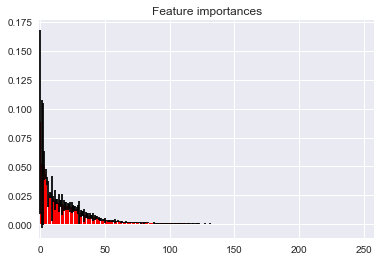

In [64]:
# Build a forest and compute the feature importances
forest = ExtraTreesClassifier(n_estimators=250,
                              random_state=0)

forest.fit(x_train, y_train2)
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")

for f in range(x_train.shape[1]):
    print("%d. %s (%f)" % (f + 1, indepv[f], importances[indices[f]]))

# Plot the feature importances of the forest
plt.figure()
plt.title("Feature importances")
plt.bar(range(x_train.shape[1]), importances[indices],
       color="r", yerr=std[indices], align="center")
plt.xlim([-1, x_train.shape[1]])
plt.show()